# Shifts in Real-World Dataset

## 1. Dose Response Dataset

### Exploring the Dataset

First, open the three dataframes `df_cell`, `df_drug` and `data`.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df_cell = pd.read_feather("data/cell_feat_processed.feather")
df_drug = pd.read_feather("data/drug_feat.feather")
data = pd.read_feather("data/viability_data_v2.feather")

`df_cell` contains the features for each cell (1000 features). These features are derived from the "expression" of 1000 genes for the cell. Each feature represents a normalized or transformed value of a specific gene's expression, capturing how active that gene is in the given cell. These features can be used to characterize the cell's state, type, or response potential to different drugs, and serve as the input for predictive modeling or exploratory analysis.

The cell is identified in the dataframe's index with a unique identifier (e.g. "a6f74cca396a3ec23dfcb2dc4fce0921"). The gene names are given in columns (e.g. "GLB1L2", "PTGR1")

In [2]:
df_cell.head()

,GLB1L2,PTGR1,TMPRSS4,MT2A,MEIS1,HR,MUC16,IRS1,ABLIM3,GPR27,...,PLEK,SPN,S100A8,PTPRC,CSF3R,LAPTM5,SRGN,S100A9,EEF1G,LYZ
a6f74cca396a3ec23dfcb2dc4fce0921,2.401884,1.738762,2.545040,1.223299,0.396001,1.781006,0.064013,1.431133,1.664847,0.016909,...,0.041099,0.092797,0.008537,0.106504,0.016909,0.229119,0.175015,0.048872,3.282300,3.735037
c410f067a394730d6d474e6f462e054b,1.342820,0.000000,0.000000,1.111029,0.000000,0.673636,0.000000,1.542740,0.059822,0.348439,...,0.479766,2.930776,0.000000,3.113060,0.000000,2.786725,1.158799,0.000000,3.344655,0.020870
34660bffc9503c1fe323b6ed5f92d065,0.000000,1.711382,0.000000,2.863628,0.768165,0.247822,0.011773,0.959328,1.450299,0.526741,...,0.066277,0.095972,0.000000,0.889839,0.011773,0.327685,0.886752,0.000000,3.349937,0.201759
0e8bf66bbb1559548333b84127ec9c19,1.220547,1.817670,2.211177,2.036891,0.990438,1.559766,1.516579,1.324937,2.113847,0.000000,...,0.007622,0.000000,1.385945,0.007622,0.022477,0.514067,0.043848,1.732348,3.257644,0.064216
e304e98537b6ca731c7180445d9e8a47,0.879155,1.144641,1.050626,1.363010,1.922074,0.459415,0.008171,0.576657,0.108859,0.075516,...,2.799677,2.840810,2.306219,2.902268,2.865871,3.240844,3.952038,2.914760,0.000000,4.345428


`df_drug` contains features for each drug molecule. These features are derived from the molecular structure using a method that converts a molecule’s formula into a numerical representation suitable for analysis and modeling. (cf. Morgan Fingerprint: https://greglandrum.github.io/rdkit-blog/posts/2023-01-18-fingerprint-generator-tutorial.html).

Each drug is identified with a unique identifier in the dataframe's index. The 512 columns corresponds to 512 features of the Morgan Fingerprint.

In [3]:
df_drug.head()

,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
4ab7c7791fae2420235d9705a0bce34b,0,1,0,0,0,0,0,0,0,1,...,1,0,0,0,0,1,0,0,0,0
858fb5e10ded9445a95745738dc61a3d,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
172cf7dff643b9cd89612a1d8c57c97f,0,0,0,0,1,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
1aa53cf31b45c9822063e1b75020f902,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
aa9ff145b41300cfcf300f5ef1bd856f,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


`data` contains the experimental measurements for cell-drug combinations.  
It has the following columns:  

- `study_id`: Identifier for the experiment.  
- `sample_id`: Refers to the cell in `df_cell`.  
- `drug_id`: Refers to the drug in `df_drug`.  
- `concentration`: The dose of the drug applied.  
- `viability`: The proportion of cells that survived after treatment.  

Formally, `viability` is calculated as the ratio between the number of cells remaining in the treated sample compared to the number of cells in the control (no drug) sample.

In [4]:
data.head()

,study_id,sample_id,drug_id,concentration,viability
2200022,beat_aml,a353ebebd4c484d4ee048ab891580b8a,045fbdb5404fb8f792067b349c643de0,0.045323,0.924535
2200040,beat_aml,214d17a7ae1ea6c2bce51a7387cd51ed,0f686dc99b2d9598618ec8add24d22c4,1.000000,0.524141
2200048,beat_aml,45b36e5160124fd6b4f2d4746b7f681a,0f686dc99b2d9598618ec8add24d22c4,0.045323,0.832124
2200058,beat_aml,7446fdafb89e480e96a85b09006816dd,0f686dc99b2d9598618ec8add24d22c4,-1.863279,1.000000
2200066,beat_aml,d974a4d7a9947c23133c90187f4f505c,469283a5bf36f1a043b1644741d23b3d,-1.385103,0.872573


This figure shows the dose-response relationship for several sample-drug pairs from the dataset.  
Each subplot displays the measured cell viability at different drug concentrations along with an isotonic regression fit (monotonically decreasing), which helps visualize the trend of decreasing viability as drug dose increases.  

**Note:** Sample and drug identifiers are shortened for readability.

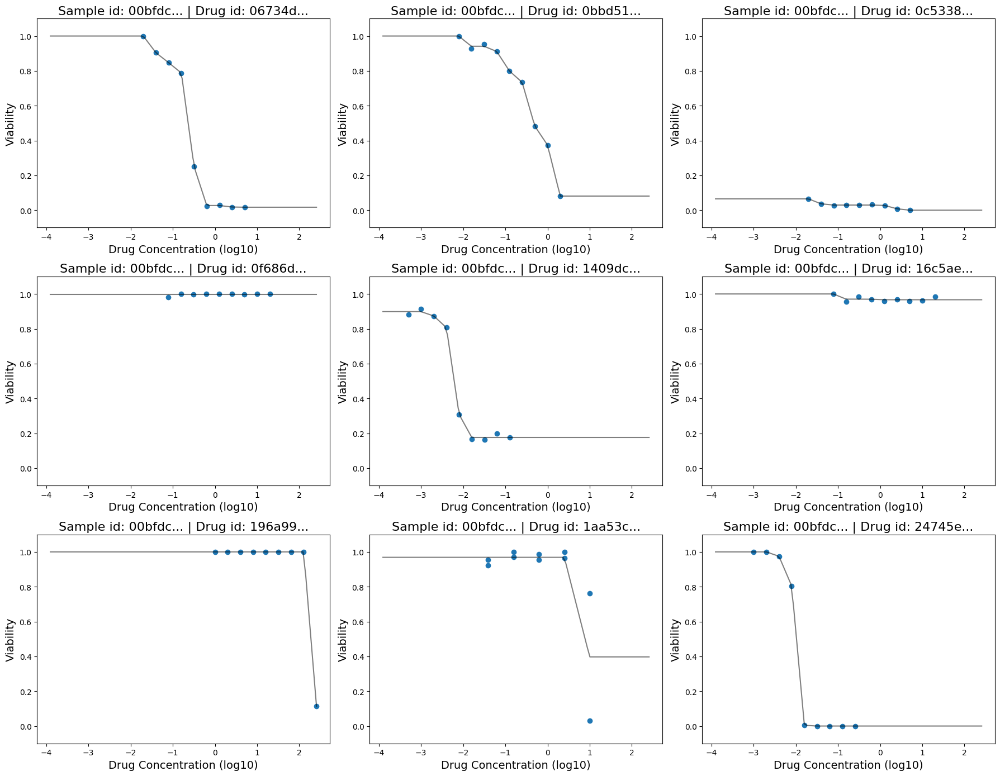

In [5]:
from sklearn.isotonic import IsotonicRegression
import matplotlib.pyplot as plt

# Group by sample and drug
grouped = data.groupby(["sample_id", "drug_id"])

# X-axis for smooth prediction
x_full = np.linspace(data.concentration.min(), data.concentration.max(), 100)

fig, axes = plt.subplots(3, 3, figsize=(18, 14))
axes = axes.flatten()

for i, ((sample, drug), group) in enumerate(grouped):
    if i >= 9:
        break

    x = group.concentration.values
    y = group.viability.values

    # Fit isotonic regression (monotonically decreasing)
    iso = IsotonicRegression(out_of_bounds="clip", increasing=False).fit(x, y)
    yp = iso.predict(x_full)

    ax = axes[i]
    ax.plot(x, y, "o", label="Data")
    ax.plot(x_full, yp, c="k", alpha=0.5, label="Isotonic fit")
    ax.set_ylim(-0.1, 1.1)
    ax.set_xlabel("Drug Concentration (log10)", fontsize=14)
    ax.set_ylabel("Viability", fontsize=14)

    # Shorten hashed names in title
    short_sample = str(sample)[:6] + "..." if len(str(sample)) > 6 else str(sample)
    short_drug = str(drug)[:6] + "..." if len(str(drug)) > 6 else str(drug)
    ax.set_title(f"Sample id: {short_sample} | Drug id: {short_drug}", fontsize=16)

plt.tight_layout()
plt.show()

### Visualizing Domain Shift

The `data` dataset contains two main types of samples:

- **Source datasets:** `["gdsc1"]` Cell lines from the [Cancer Cell Line Encyclopedia (GDSC)](https://www.cancerrxgene.org/). These are immortalized cells that can be grown indefinitely in the lab and are widely used for high-throughput drug screening.  

- **Target dataset:** `["beat_aml"]` Patient-derived cells from the [Beat AML (Acute Myeloid Leukemia) study](https://datacatalog.ccdi.cancer.gov/dataset/Vizome-BEATAML2.0). These cells are taken directly from patients and better represent the complexity and variability of real tumors.

In short, cell lines are standardized and easier to work with, while patient-derived cells better capture the biological variability observed in actual patients.

In [6]:
data.study_id.value_counts()

study_id
gdsc1       183506
beat_aml     35840
Name: count, dtype: int64

In [7]:
SRC_STUDIES = ["gdsc1"]
TGT_STUDY = ["beat_aml"]

In [8]:
df_src = data.loc[data.study_id.isin(SRC_STUDIES)]
df_tgt = data.loc[data.study_id.isin(TGT_STUDY)]

Here we check how many unique cell samples and drug compounds are present in the source (cell line) and target (patient-derived) datasets.  
Note that each dataset contains multiple combinations of sample, drug, and dose.

In [9]:
# Number of unique samples and drugs in source and target datasets
num_src_samples = df_src.sample_id.nunique()
num_tgt_samples = df_tgt.sample_id.nunique()
num_src_drugs = df_src.drug_id.nunique()
num_tgt_drugs = df_tgt.drug_id.nunique()

print(f"Source dataset: {num_src_samples} unique samples, {num_src_drugs} unique drugs")
print(f"Target dataset: {num_tgt_samples} unique samples, {num_tgt_drugs} unique drugs")

Source dataset: 716 unique samples, 31 unique drugs
Target dataset: 444 unique samples, 18 unique drugs


We now visualize the distribution of source (cell line) and target (patient-derived) samples in the reduced 2D **cell expression feature space** obtained via PCA.

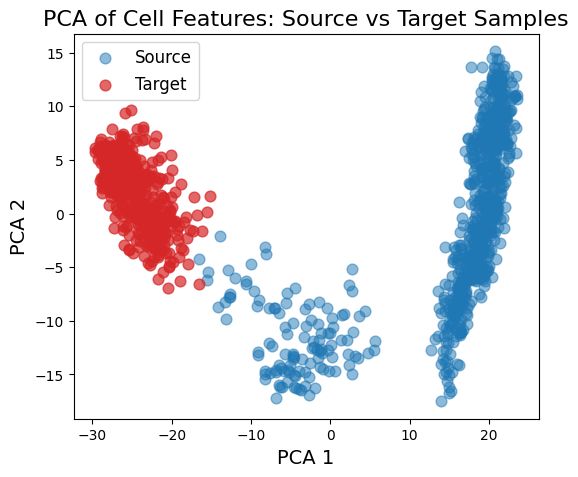

In [10]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Get unique samples
sample_src = df_src.sample_id.unique()
sample_tgt = df_tgt.sample_id.unique()

# Select cell features
cell_src = df_cell.loc[sample_src]
cell_tgt = df_cell.loc[sample_tgt]

# Combine source and target
n = cell_src.shape[0]
X = np.concatenate((cell_src.values, cell_tgt.values))

# PCA to 2 components
X_pca = PCA(2, random_state=67).fit_transform(X)

# Plot
plt.figure(figsize=(6, 5))
plt.scatter(X_pca[:n, 0], X_pca[:n, 1], c="C0", alpha=0.5, label="Source", s=60)
plt.scatter(X_pca[n:, 0], X_pca[n:, 1], c="C3", alpha=0.7, label="Target", s=60)

plt.xlabel("PCA 1", fontsize=14)
plt.ylabel("PCA 2", fontsize=14)
plt.title("PCA of Cell Features: Source vs Target Samples", fontsize=16)
plt.legend(fontsize=12)
plt.show()

We can clearly see a **shift between the two domains**, with almost no overlap between the source and target distributions. This indicates that the cell expression profiles of patient-derived cells differ substantially from those of standardized cell lines.  

Possible reasons for this shift include biological variability in patient-derived cells, differences in experimental conditions, and the way gene expression features capture these differences.

---------

Next plot visualizes the distribution of source (cell line) and target (patient-derived) **drug features** in a 2D PCA space.  

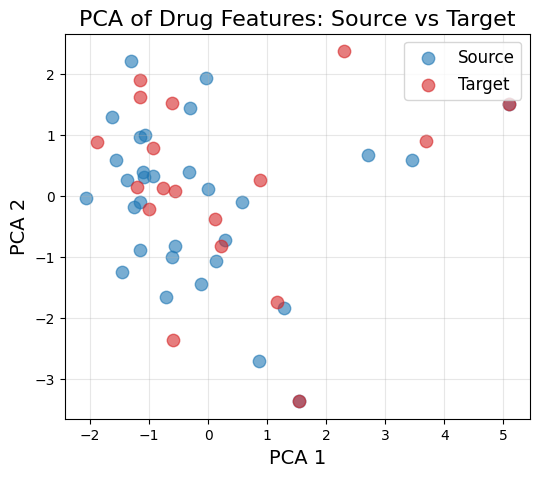

In [11]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Unique drugs
drug_src = df_src.drug_id.unique()
drug_tgt = df_tgt.drug_id.unique()

# Select drug features
drug_feat_src = df_drug.loc[drug_src]
drug_feat_tgt = df_drug.loc[drug_tgt]

# Combine source and target
n = drug_feat_src.shape[0]
X = np.concatenate((drug_feat_src.values, drug_feat_tgt.values))

# t-SNE to 2 components
X_tsne = PCA(2, random_state=67).fit_transform(X)

# Plot
plt.figure(figsize=(6, 5))
plt.scatter(X_tsne[:n, 0], X_tsne[:n, 1], c="C0", alpha=0.6, s=80, label="Source")
plt.scatter(X_tsne[n:, 0], X_tsne[n:, 1], c="C3", alpha=0.6, s=80, label="Target")

plt.xlabel("PCA 1", fontsize=14)
plt.ylabel("PCA 2", fontsize=14)
plt.title("PCA of Drug Features: Source vs Target", fontsize=16)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.show()

Unlike the cell expression features, the drug feature distributions largely **overlap**, reflecting that some drugs are shared between the source and target datasets and that the chemical feature representation is consistent across datasets.

-----------

Finally, visualizing the distribution of drug concentrations shows that there is only a slight shift between the source and target datasets.

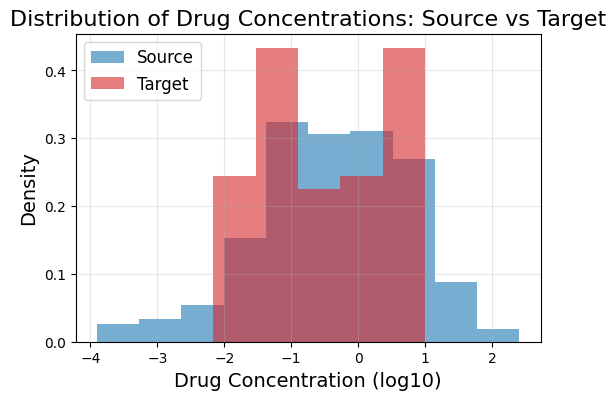

In [12]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 4))

plt.hist(df_src.concentration.values, bins=10, density=True, alpha=0.6, color="C0", label="Source")
plt.hist(df_tgt.concentration.values, bins=5, density=True, alpha=0.6, color="C3", label="Target")

plt.xlabel("Drug Concentration (log10)", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Distribution of Drug Concentrations: Source vs Target", fontsize=16)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

In summary, we have observed that the **distribution of input features differs** between the source and target datasets (especially for cell expression features), i.e., $P(X_{src}) \neq P(X_{tgt})$. Additionally, the **support of the input distributions is different**, i.e., $\text{supp}(P(X_{src})) \neq \text{supp}(P(X_{tgt}))$

------------

Next, we want to get a sense of the covariate shift assumption: that is, whether the relationship between features and outcomes is the same in the source and target datasets $P(Y_{src} | X_{src}) = P(Y_{tgt} | X_{tgt})$. More precisely, for the same cell expression and same drug, do we have the same dose response?

In practice, this is often hard to check because we usually **don’t have labels** (viability measurements) for the target dataset. Also, since the input distribution supports are different, it’s not easy to directly compare $P(Y | X)$ between source and target because no $x$ is shared between the two domains.  

To still get an idea, we’ll pick the **target cells that are closest in expression to each source cell** (using cosine similarity), and then look at the dose-response curves for the **two drugs that appear in both datasets**.  

Note that we can do this here because we **have target labels**, which allows us to make a direct comparison.

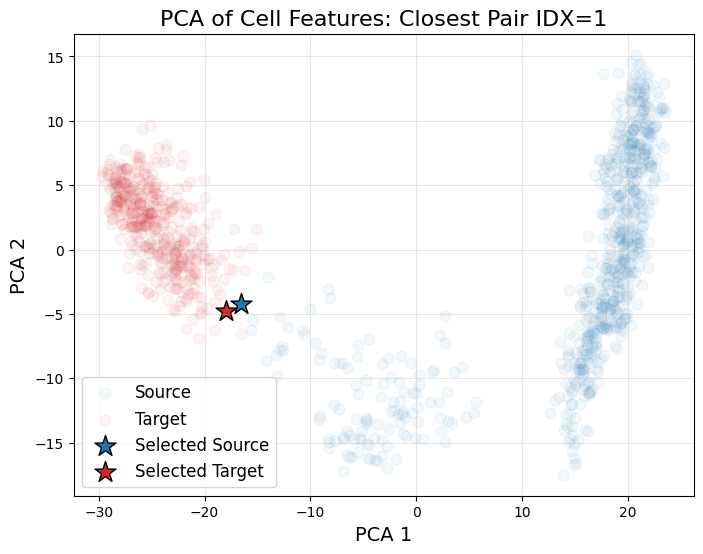

Selected Source Cell: ce2f180860a6a1aadf41d09826670f35
Selected Target Cell: f7f0a952fd809657b5ca3fc6aad568f9


In [13]:
from sklearn.metrics.pairwise import euclidean_distances
import matplotlib.pyplot as plt
import numpy as np

# Parameter: which closest pair to select (0 = closest, 1 = 2nd closest, etc.)
IDX_CLOSEST = 1  # change this to 1, 2, ... for next closest

# Get unique samples
sample_src = df_src.sample_id.unique()
sample_tgt = df_tgt.sample_id.unique()

# Select cell features
cell_src = df_cell.loc[sample_src]
cell_tgt = df_cell.loc[sample_tgt]

# Combine source and target
n = cell_src.shape[0]
X = np.concatenate((cell_src.values, cell_tgt.values))

# PCA to 2 components
X_pca = PCA(2, random_state=67).fit_transform(X)

# Separate PCA coordinates
X_pca_src = X_pca[:n, :]
X_pca_tgt = X_pca[n:, :]

# Compute Euclidean distances in PCA space
Dist_pca = euclidean_distances(X_pca_tgt, X_pca_src)

# Flatten and sort distances
Dist_flat = Dist_pca.flatten()
sorted_idx = np.argsort(Dist_flat)

# Select the desired closest pair
i, j = divmod(sorted_idx[IDX_CLOSEST], Dist_pca.shape[1])
cell_name_tgt = cell_tgt.iloc[i].name
cell_name_src = cell_src.iloc[j].name

# Indices in PCA array
idx_src = np.where(cell_src.index == cell_name_src)[0][0]
idx_tgt = np.where(cell_tgt.index == cell_name_tgt)[0][0] + n  # adjust for combined array

# Plot PCA with highlighted selected pair
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:n, 0], X_pca[:n, 1], c="C0", alpha=0.05, s=60, label="Source")
plt.scatter(X_pca[n:, 0], X_pca[n:, 1], c="C3", alpha=0.05, s=60, label="Target")

# Highlight selected closest cells
plt.scatter(X_pca[idx_src, 0], X_pca[idx_src, 1], c="C0", s=250, edgecolors='k', marker='*', alpha=1.0, label="Selected Source")
plt.scatter(X_pca[idx_tgt, 0], X_pca[idx_tgt, 1], c="C3", s=250, edgecolors='k', marker='*', alpha=1.0, label="Selected Target")

plt.xlabel("PCA 1", fontsize=14)
plt.ylabel("PCA 2", fontsize=14)
plt.title(f"PCA of Cell Features: Closest Pair IDX={IDX_CLOSEST}", fontsize=16)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

print(f"Selected Source Cell: {cell_name_src}")
print(f"Selected Target Cell: {cell_name_tgt}")

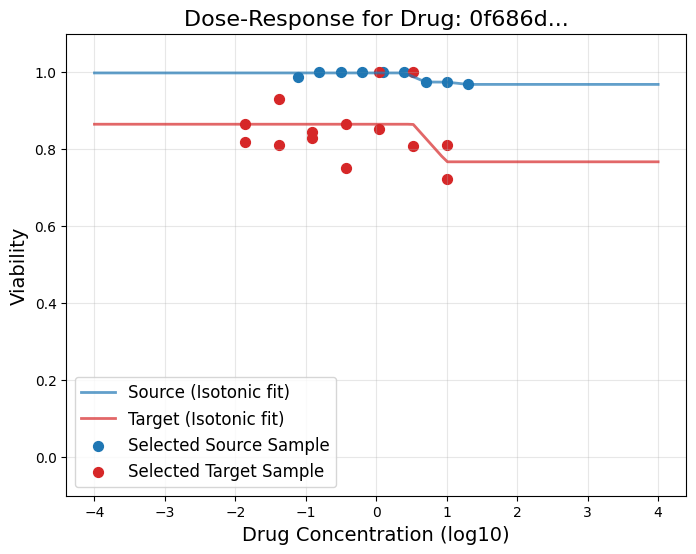

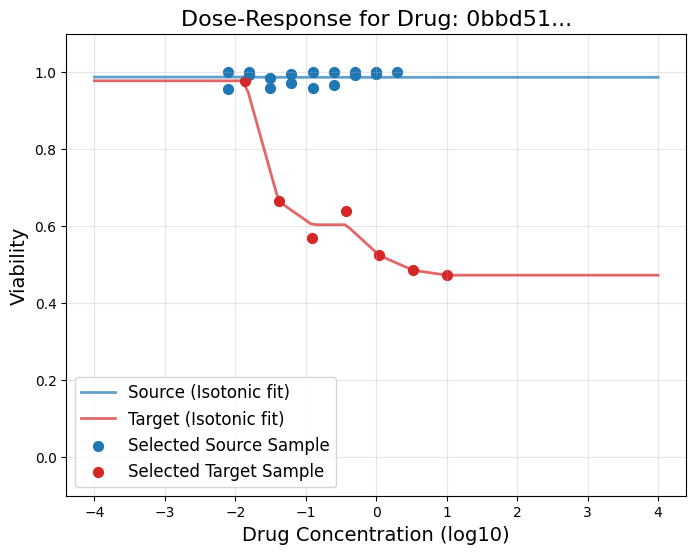

In [14]:
from sklearn.isotonic import IsotonicRegression

# Identify shared drugs
drugs_tgt = df_tgt.loc[df_tgt.sample_id == cell_name_tgt, "drug_id"].unique()
drugs_src = df_src.loc[df_src.sample_id == cell_name_src, "drug_id"].unique()
inter_drugs = set(drugs_tgt) & set(drugs_src)

# X-axis for smooth isotonic prediction
x_full = np.linspace(-4, 4, 100)

# Plot dose-response curves for shared drugs
for drug in inter_drugs:
    df_tgt_loc = df_tgt[(df_tgt.sample_id == cell_name_tgt) & (df_tgt.drug_id == drug)]
    df_src_loc = df_src[(df_src.sample_id == cell_name_src) & (df_src.drug_id == drug)]

    x_tgt, y_tgt = df_tgt_loc.concentration.values, df_tgt_loc.viability.values
    x_src, y_src = df_src_loc.concentration.values, df_src_loc.viability.values

    # Fit isotonic regression
    iso_src = IsotonicRegression(out_of_bounds="clip", increasing=False).fit(x_src, y_src)
    yp_src = iso_src.predict(x_full)
    iso_tgt = IsotonicRegression(out_of_bounds="clip", increasing=False).fit(x_tgt, y_tgt)
    yp_tgt = iso_tgt.predict(x_full)

    # Plot
    plt.figure(figsize=(8,6))
    plt.plot(x_full, yp_src, c="C0", alpha=0.7, lw=2, label="Source (Isotonic fit)")
    plt.plot(x_full, yp_tgt, c="C3", alpha=0.7, lw=2, label="Target (Isotonic fit)")
    plt.scatter(x_src, y_src, c="C0", s=50, label="Selected Source Sample")
    plt.scatter(x_tgt, y_tgt, c="C3", s=50, label="Selected Target Sample")

    plt.xlabel("Drug Concentration (log10)", fontsize=14)
    plt.ylabel("Viability", fontsize=14)
    plt.title(f"Dose-Response for Drug: {str(drug)[:6]}...", fontsize=16)
    plt.ylim(-0.1, 1.1)
    plt.legend(fontsize=12)
    plt.grid(alpha=0.3)
    plt.show()

While this comparison is not definitive, since we are not looking at the same cell—we can see that even for two cells that are close in expression space, the dose-response curves differ between the source and target domains. This suggests that $P(Y \mid X)$ is likely different across domains.  

In practice, this means we will probably need some **labeled target data** or a suitable **transformation of the features** $\phi(X)$ such that $P(Y \mid \phi(X))$ becomes more similar between the two domains.

------

Finally, a visualization of the viability distributions also reveals that $P(Y_{src}) \neq P(Y_{tgt})$

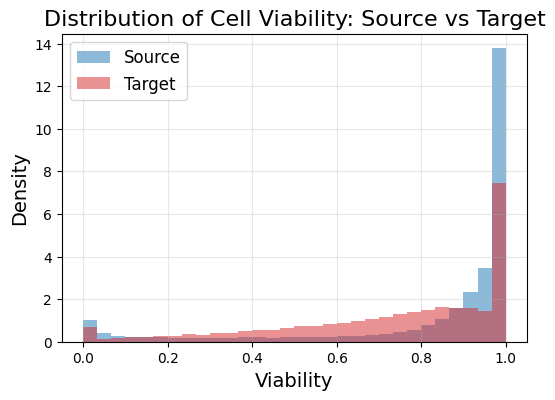

In [15]:
plt.figure(figsize=(6, 4))
plt.hist(df_src.viability.values, bins=30, density=True, alpha=0.5, color="C0", label="Source")
plt.hist(df_tgt.viability.values, bins=30, density=True, alpha=0.5, color="C3", label="Target")

plt.xlabel("Viability", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Distribution of Cell Viability: Source vs Target", fontsize=16)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)
plt.show()

### Impact of the Shift on Traditional Machine Learning

In [16]:
# Downsample for training
df_src = df_src.sample(20000, replace=False, random_state=67)
df_tgt = df_tgt.sample(10000, replace=False, random_state=67)

To evaluate how well a model trained on one domain transfers to the other, we construct input feature matrices for both **source** and **target** datasets.

Each feature vector **X** is built by concatenating:
- **cell expression features**
- **drug features**
- **dose (concentration)**

The **label** to predict is the **viability**, representing the observed cellular response.

With this setup, we can **train a machine learning model on the source domain** and evaluate its performance on the **target domain** to analyze domain shift and determine whether adaptation is required.

In [17]:
# Duplicate concentration feature 1000 times for rf random feature selection

X_src = np.concatenate((
    df_cell.loc[df_src.sample_id.values].values,
    df_drug.loc[df_src.drug_id.values].values,
    np.tile(df_src.concentration.values.reshape(-1, 1), (1, 1000))
), axis=1)

y_src = df_src.viability.values

X_tgt = np.concatenate((
    df_cell.loc[df_tgt.sample_id.values].values,
    df_drug.loc[df_tgt.drug_id.values].values,
    np.tile(df_tgt.concentration.values.reshape(-1, 1), (1, 1000))
), axis=1)

y_tgt = df_tgt.viability.values

#### Source Only

We now fit a model on the source domain and evaluate its performances on the target domain. We choose RandomForest for its flexibility.

In [18]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.kernel_ridge import KernelRidge
import matplotlib.pyplot as plt

# --- Train/Test split on SOURCE domain ---
X_train, X_test, y_train, y_test = train_test_split(
    X_src, y_src, test_size=0.2, random_state=67
)

# --- Train Random Forest ---
rf = RandomForestRegressor(
    n_estimators=20,       
    max_depth=20,          
    max_features='sqrt',  
    n_jobs=None,            
    random_state=42
)

rf.fit(X_train, y_train)

# --- Predictions ---
y_pred_test = rf.predict(X_test)
y_pred_tgt  = rf.predict(X_tgt)     # evaluate on target for comparison

# --- Metrics on source test ---
r2_src = r2_score(y_test, y_pred_test)
mse_src = mean_squared_error(y_test, y_pred_test)
print(f"Source Test R2: {r2_src:.3f} | MSE: {mse_src:.3f}")

# --- Metrics on TARGET domain ---
r2_tgt = r2_score(y_tgt, y_pred_tgt)
mse_tgt = mean_squared_error(y_tgt, y_pred_tgt)
print(f"Target R2: {r2_tgt:.3f} | MSE: {mse_tgt:.3f}")

Source Test R2: 0.673 | MSE: 0.026
Target R2: 0.003 | MSE: 0.070


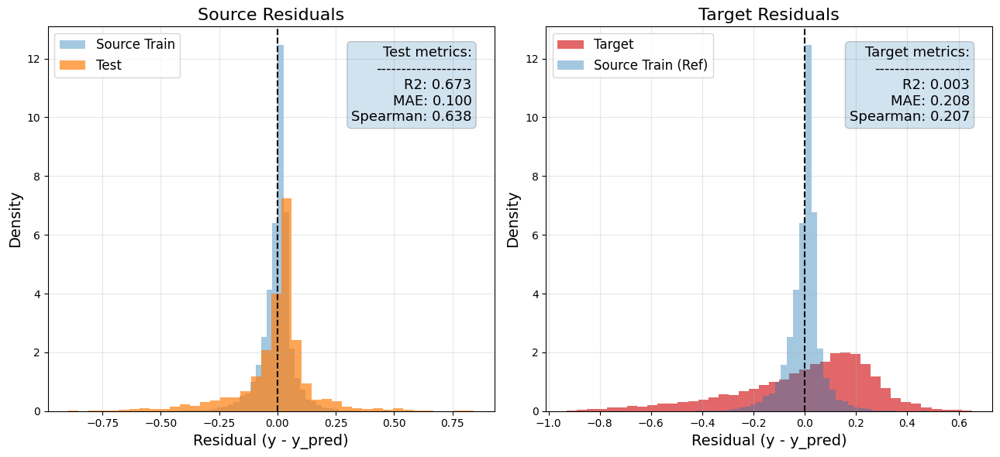

In [19]:
from scipy.stats import spearmanr
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt

# --- Compute residuals ---
res_train = y_train - rf.predict(X_train)
res_test  = y_test  - y_pred_test
res_tgt   = y_tgt   - y_pred_tgt

# --- Metrics ---
metrics_src = {
    "R2": r2_score(y_test, y_pred_test),
    "MAE": mean_absolute_error(y_test, y_pred_test),
    "Spearman": spearmanr(y_test, y_pred_test)[0],
}
metrics_tgt = {
    "R2": r2_score(y_tgt, y_pred_tgt),
    "MAE": mean_absolute_error(y_tgt, y_pred_tgt),
    "Spearman": spearmanr(y_tgt, y_pred_tgt)[0],
}

# --- Plot residual histograms ---
plt.figure(figsize=(13, 6))

# Left: source train & test residuals
plt.subplot(1, 2, 1)
plt.hist(res_train, bins=40, alpha=0.4, density=True, label="Source Train", color="C0")
plt.hist(res_test,  bins=40, alpha=0.7, density=True, label="Test",  color="C1")
plt.axvline(0, color="k", linestyle="--")
plt.xlabel("Residual (y - y_pred)", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Source Residuals", fontsize=16)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)

# Display metrics on plot
text_src = "Test metrics:\n-------------------\n"
text_src += "\n".join([f"{k}: {v:.3f}" for k, v in metrics_src.items()])
plt.text(0.95, 0.95, text_src, transform=plt.gca().transAxes,
         fontsize=13, va="top", ha="right",
         bbox=dict(boxstyle="round", alpha=0.2))

# Right: target residuals + source train for reference
plt.subplot(1, 2, 2)
plt.hist(res_tgt,  bins=40, alpha=0.7, density=True, label="Target", color="C3")
plt.hist(res_train, bins=40, alpha=0.4, density=True, label="Source Train (Ref)", color="C0")
plt.axvline(0, color="k", linestyle="--")
plt.xlabel("Residual (y - y_pred)", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Target Residuals", fontsize=16)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)

# Display metrics on plot
text_tgt = "Target metrics:\n-------------------\n"
text_tgt += "\n".join([f"{k}: {v:.3f}" for k, v in metrics_tgt.items()])
plt.text(0.95, 0.95, text_tgt, transform=plt.gca().transAxes,
         fontsize=13, va="top", ha="right",
         bbox=dict(boxstyle="round", alpha=0.2))

plt.tight_layout()
plt.show()

From the residual plots and metrics, it is clear that the model trained on the **source domain** performs relatively well on source data (train and test), but **generalizes poorly to the target domain**.  

This suggests that the learned mapping $X \rightarrow Y$ in the source domain does not fully capture the behavior of patient-derived cells, highlighting the **domain shift** problem and the need for adaptation or target data to improve predictions.

----------

We now show model predictions of dose response on source and target samples

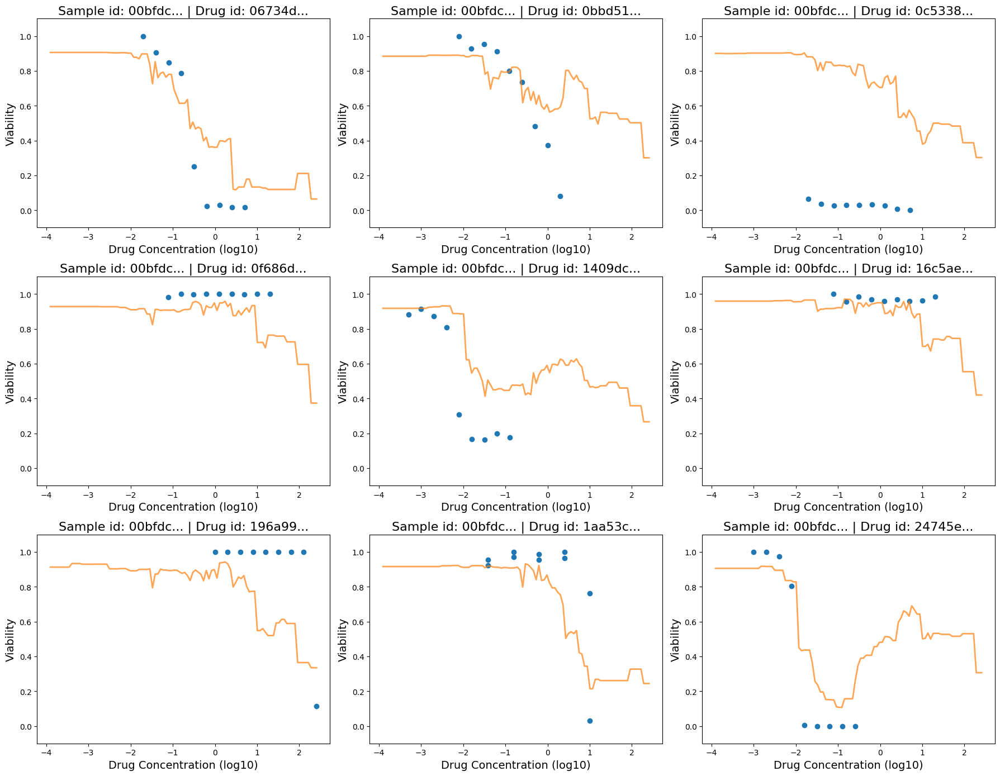

In [20]:
import numpy as np
import matplotlib.pyplot as plt

src_data = data.loc[data.study_id.isin(SRC_STUDIES)]

# X_full for smooth curve
x_full = np.linspace(src_data.concentration.min(), src_data.concentration.max(), 100)

# Group by sample and drug
grouped = src_data.groupby(["sample_id", "drug_id"])

fig, axes = plt.subplots(3, 3, figsize=(18, 14))
axes = axes.flatten()

for i, ((sample, drug), group) in enumerate(grouped):
    if i >= 9:
        break

    x = group.concentration.values
    y = group.viability.values

    # Build feature matrix for RF prediction
    X_pred = np.concatenate([
        np.repeat(df_cell.loc[[sample]].values, len(x_full), axis=0),
        np.repeat(df_drug.loc[[drug]].values, len(x_full), axis=0),
        np.tile(x_full.reshape(-1, 1), (1, df_cell.shape[1]))  # tile dose to match feature count
    ], axis=1)

    # Predict using trained RF
    yp = rf.predict(X_pred)

    ax = axes[i]
    ax.plot(x, y, "o", label="Data")
    ax.plot(x_full, yp, c="C1", alpha=0.7, lw=2, label="RF prediction")
    ax.set_ylim(-0.1, 1.1)
    ax.set_xlabel("Drug Concentration (log10)", fontsize=14)
    ax.set_ylabel("Viability", fontsize=14)

    # Shorten hashed names in title
    short_sample = str(sample)[:6] + "..." if len(str(sample)) > 6 else str(sample)
    short_drug = str(drug)[:6] + "..." if len(str(drug)) > 6 else str(drug)
    ax.set_title(f"Sample id: {short_sample} | Drug id: {short_drug}", fontsize=16)

plt.tight_layout()
plt.show()

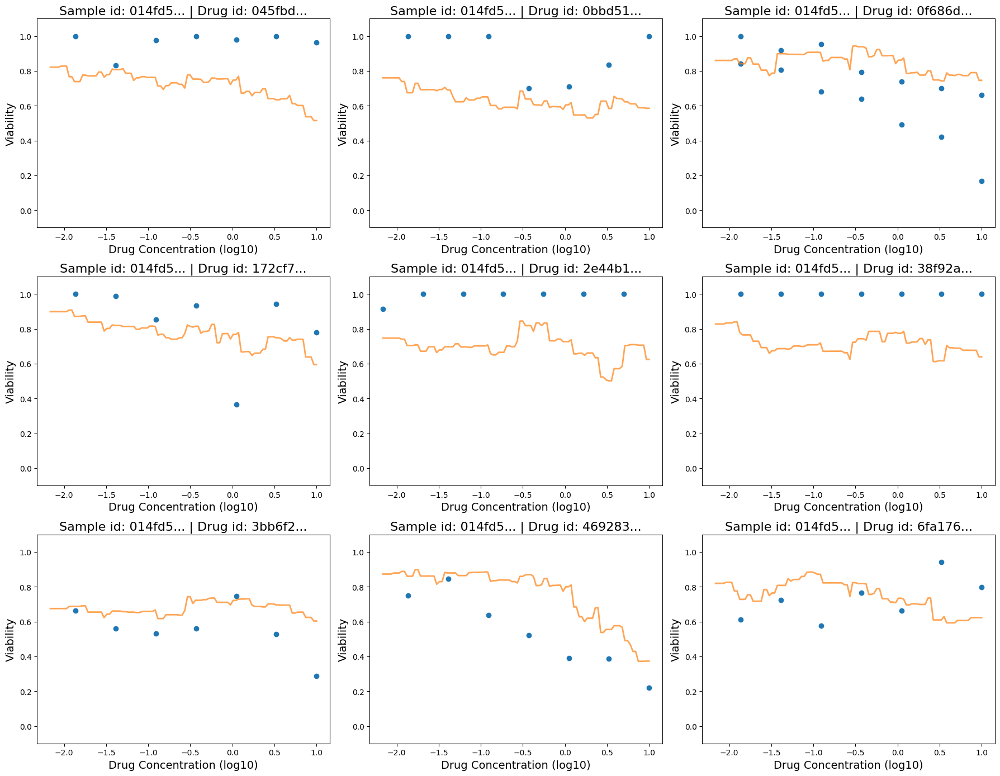

In [21]:
import numpy as np
import matplotlib.pyplot as plt

tgt_data = data.loc[data.study_id.isin(TGT_STUDY)]

# X_full for smooth curve
x_full = np.linspace(tgt_data.concentration.min(), tgt_data.concentration.max(), 100)

# Group by sample and drug
grouped = tgt_data.groupby(["sample_id", "drug_id"])

fig, axes = plt.subplots(3, 3, figsize=(18, 14))
axes = axes.flatten()

for i, ((sample, drug), group) in enumerate(grouped):
    if i >= 9:
        break

    x = group.concentration.values
    y = group.viability.values

    # Build feature matrix for RF prediction
    X_pred = np.concatenate([
        np.repeat(df_cell.loc[[sample]].values, len(x_full), axis=0),
        np.repeat(df_drug.loc[[drug]].values, len(x_full), axis=0),
        np.tile(x_full.reshape(-1, 1), (1, df_cell.shape[1]))  # tile dose to match feature count
    ], axis=1)

    # Predict using trained RF
    yp = rf.predict(X_pred)

    ax = axes[i]
    ax.plot(x, y, "o", label="Data")
    ax.plot(x_full, yp, c="C1", alpha=0.7, lw=2, label="RF prediction")
    ax.set_ylim(-0.1, 1.1)
    ax.set_xlabel("Drug Concentration (log10)", fontsize=14)
    ax.set_ylabel("Viability", fontsize=14)

    # Shorten hashed names in title
    short_sample = str(sample)[:6] + "..." if len(str(sample)) > 6 else str(sample)
    short_drug = str(drug)[:6] + "..." if len(str(drug)) > 6 else str(drug)
    ax.set_title(f"Sample id: {short_sample} | Drug id: {short_drug}", fontsize=16)

plt.tight_layout()
plt.show()

#### Target Only

In [22]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error

# --- Train/Test split on TARGET domain ---
X_train_tgt, X_test_tgt, y_train_tgt, y_test_tgt = train_test_split(
    X_tgt, y_tgt, test_size=0.2, random_state=67
)

# --- Train Random Forest on TARGET ---
rf_tgt = RandomForestRegressor(
    n_estimators=20,
    max_depth=20,
    max_features='sqrt',
    n_jobs=None,
    random_state=42
)

rf_tgt.fit(X_train_tgt, y_train_tgt)

# --- Predictions ---
y_pred_test_tgt = rf_tgt.predict(X_test_tgt)

# --- Metrics on target test ---
r2_tgt_split = r2_score(y_test_tgt, y_pred_test_tgt)
mse_tgt_split = mean_squared_error(y_test_tgt, y_pred_test_tgt)

print(f"Target Test R2: {r2_tgt_split:.3f} | MSE: {mse_tgt_split:.3f}")

Target Test R2: 0.418 | MSE: 0.041


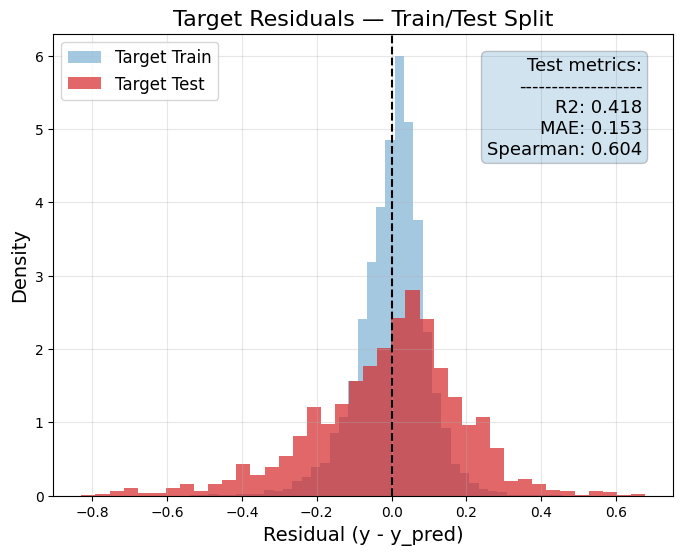

In [23]:
from sklearn.metrics import r2_score, mean_absolute_error
from scipy.stats import spearmanr
import matplotlib.pyplot as plt

# --- Compute residuals for target train/test ---
res_train_tgt = y_train_tgt - rf_tgt.predict(X_train_tgt)
res_test_tgt  = y_test_tgt  - rf_tgt.predict(X_test_tgt)

# --- Metrics ---
metrics_tgt_split = {
    "R2": r2_score(y_test_tgt, rf_tgt.predict(X_test_tgt)),
    "MAE": mean_absolute_error(y_test_tgt, rf_tgt.predict(X_test_tgt)),
    "Spearman": spearmanr(y_test_tgt, rf_tgt.predict(X_test_tgt))[0],
}

# --- Plot ---
plt.figure(figsize=(8,6))
plt.hist(res_train_tgt, bins=40, alpha=0.4, density=True, label="Target Train", color="C0")
plt.hist(res_test_tgt,  bins=40, alpha=0.7, density=True, label="Target Test", color="C3")
plt.axvline(0, color="k", linestyle="--")
plt.xlabel("Residual (y - y_pred)", fontsize=14)
plt.ylabel("Density", fontsize=14)
plt.title("Target Residuals — Train/Test Split", fontsize=16)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)

# Display metrics on plot
text_metrics = "Test metrics:\n-------------------\n"
text_metrics += "\n".join([f"{k}: {v:.3f}" for k, v in metrics_tgt_split.items()])
plt.text(0.95, 0.95, text_metrics, transform=plt.gca().transAxes,
         fontsize=13, va="top", ha="right",
         bbox=dict(boxstyle="round", alpha=0.2))

plt.show()

The residual plot and metrics for the target train/test split show that the Random Forest model **fits the target data well**, achieving reasonable R², MAE, and Spearman correlation.  

This demonstrates that it is indeed possible to build an accurate model for the target domain. However, the earlier results also make it clear that **training on the source domain alone is not sufficient**, as the source-trained model performs poorly on the target.

#### Only a Few Target

Target data are valuable but may be expensive. We want to see how many target training data would be needed to achieve the same performance as the source only model

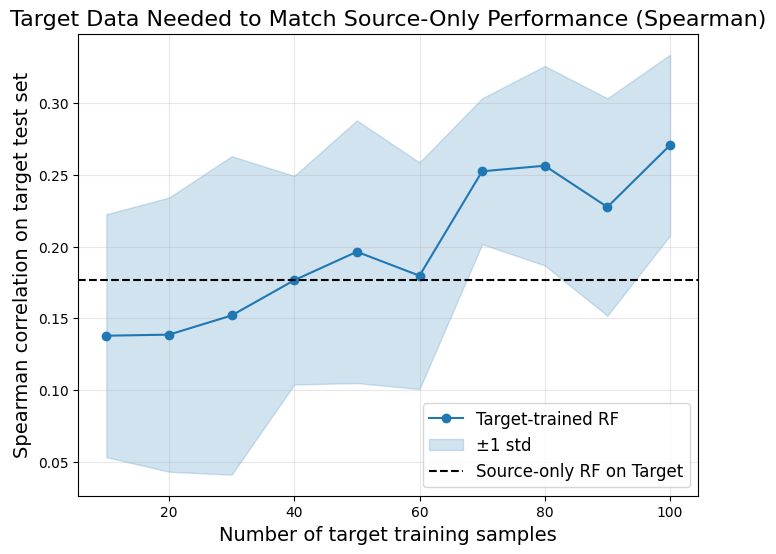

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import spearmanr

# --- Parameters ---
n_samples_list = np.arange(10, 101, 10)  # 10, 20, ..., 100
n_repeats = 20  # number of repetitions per sample size
spearman_means = []
spearman_stds = []

rng = np.random.default_rng(42)
indices_full = np.arange(X_train_tgt.shape[0])

for n_samples in n_samples_list:
    spearman_list = []
    for _ in range(n_repeats):
        indices = rng.choice(indices_full, size=n_samples, replace=False)
        X_sub = X_train_tgt[indices]
        y_sub = y_train_tgt[indices]

        rf_sub = RandomForestRegressor(
            n_estimators=20,
            max_depth=20,
            max_features='sqrt',
            random_state=42
        )
        rf_sub.fit(X_sub, y_sub)

        y_pred = rf_sub.predict(X_test_tgt)
        spearman_list.append(spearmanr(y_test_tgt, y_pred)[0])

    spearman_means.append(np.mean(spearman_list))
    spearman_stds.append(np.std(spearman_list))

# --- Spearman of source-only model on target ---
spearman_src_on_tgt = spearmanr(y_test_tgt, rf.predict(X_test_tgt))[0]

# --- Plot with confidence interval ---
plt.figure(figsize=(8,6))
spearman_means = np.array(spearman_means)
spearman_stds = np.array(spearman_stds)

plt.plot(n_samples_list, spearman_means, marker='o', label="Target-trained RF")
plt.fill_between(n_samples_list, spearman_means - spearman_stds, spearman_means + spearman_stds,
                 color='C0', alpha=0.2, label="±1 std")
plt.axhline(spearman_src_on_tgt, color='k', linestyle='--', label="Source-only RF on Target")

plt.xlabel("Number of target training samples", fontsize=14)
plt.ylabel("Spearman correlation on target test set", fontsize=14)
plt.title("Target Data Needed to Match Source-Only Performance (Spearman)", fontsize=16)
plt.legend(fontsize=12, loc="lower right")
plt.grid(alpha=0.3)
plt.show()

### Conclusion

From the learning curve experiment, we see that **using only ~100 training target instances** is enough for a target-trained model to reach the performance of a source-only model trained on **30k source instances**. This clearly highlights the **impact of domain shift** and the importance of having **target labels** in some cases.  

It is worth noting that **Random Forests** may not be ideal here because they produce very **sharp decision functions** and may not generalize smoothly. A **MLP or other continuous model** could potentially generalize better across domains.  

Additionally, one could try to **correct the shift in cell gene expression features** by applying standard scaling to both source and target datasets before training.  

> Autonomy exercise: try adding this feature scaling in the notebook and see how it affects the model performance on the target domain.

## CityCam

We now turn our attention to the **CityCam dataset** ([link](http://printart.isr.ist.utl.pt/citycam/)), which consists of traffic webcam images. The goal is to **predict the number of vehicles** in each image.  

To simplify analysis, we work with **features extracted from a pretrained ResNet model on ImageNet**, rather than raw images. This gives us a **2048-dimensional feature vector** per image, making it easier to analyze patterns and train models in feature space.

In [7]:
from utils_intro import citycam_weather_v2
import pandas as pd

citycam_data = citycam_weather_v2()

# Get the timeline
time_df = pd.Series(pd.to_datetime(citycam_data["time"]))

# Sort the timeline
args = time_df.sort_values().index

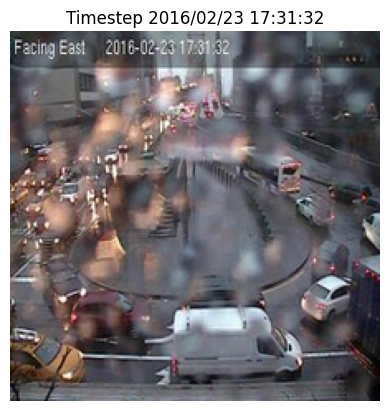

In [6]:
# # Dont launch this cell

# import matplotlib.pyplot as plt
# import numpy as np
# from matplotlib import rc
# from matplotlib.animation import FuncAnimation

# period = 50

# # Set animation display mode
# rc('animation', html='jshtml', embed_limit=200 * 1024 * 1024)

# # Assume `images` is a list of PIL Images from your denoising loop
# # Convert them to arrays for matplotlib
# frames = [np.array(img) for img in citycam_data["X"]]

# # Create the figure and axis
# fig, ax = plt.subplots()
# im = ax.imshow(frames[0])
# ax.axis("off")  # Hide axes

# # Animation function
# def animate(i):
#     i = min(i * period, len(frames)-1)
#     time = str(citycam_data["time"][args[i]])
#     ax.set_title(f"Timestep {time}")
#     im.set_data(frames[args[i]])
#     return [im]

# # Create the animation
# anim = FuncAnimation(
#     fig,
#     animate,
#     frames=len(frames) // period + 1,
#     interval=200,  # time between frames in ms
#     blit=True,
#     repeat=True
# )

# # Display animation in notebook
# anim

An interesting aspect of this dataset is that **around 4 PM, raindrops begin to appear on the camera lens**, which blur the images and create light artifacts from the cars. This introduces a **domain shift** that can be observed in the input feature space, making the prediction task more challenging.

--------

We give here two visualizations of this shift, using PCA and TSNE 

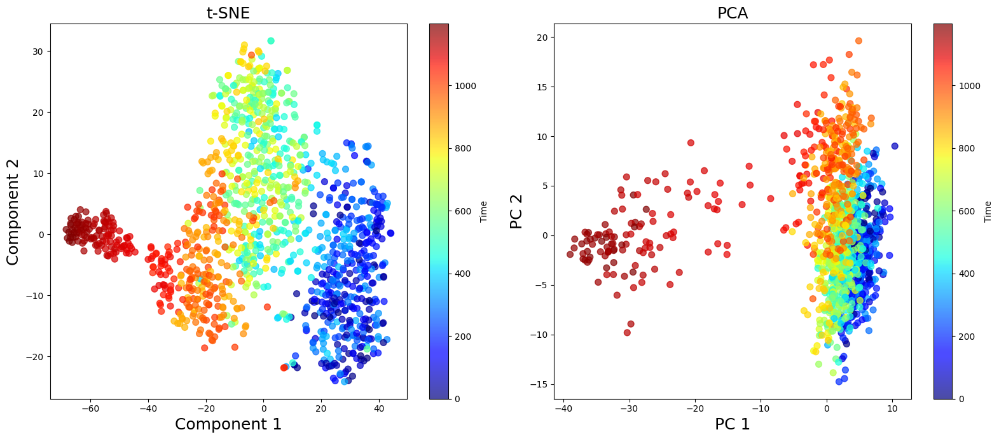

In [8]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import numpy as np

# Time array for coloring
time_arr = np.zeros(len(args))
time_arr[args] = np.arange(len(args))

# --- t-SNE ---
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_coords = tsne.fit_transform(citycam_data['Xt'])

# --- PCA ---
pca = PCA(n_components=2, random_state=42)
pca_coords = pca.fit_transform(citycam_data['Xt'])

# --- Plot side by side ---
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# t-SNE plot
scatter_tsne = axes[0].scatter(tsne_coords[:, 0], tsne_coords[:, 1],
                               c=time_arr, cmap='jet', s=50, alpha=0.7)
axes[0].set_title('t-SNE', fontsize=18)
axes[0].set_xlabel('Component 1', fontsize=18)
axes[0].set_ylabel('Component 2', fontsize=18)
plt.colorbar(scatter_tsne, ax=axes[0], label='Time')

# PCA plot
scatter_pca = axes[1].scatter(pca_coords[:, 0], pca_coords[:, 1],
                              c=time_arr, cmap='jet', s=50, alpha=0.7)
axes[1].set_title('PCA', fontsize=18)
axes[1].set_xlabel('PC 1', fontsize=18)
axes[1].set_ylabel('PC 2', fontsize=18)
plt.colorbar(scatter_pca, ax=axes[1], label='Time')

plt.tight_layout()
plt.show()

We observe that the last part of the video (in dark red) is clearly shifted in comparison to the first part.

-------

Let's now evaluate the impact of this shift with a simple linear model trained on the 50% first images. 

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

# Sort data by time
time_sorted = time_df.sort_values().values  # array of timestamps
sort_idx = np.argsort(time_df.values)

X = citycam_data['Xt'][sort_idx]
y = citycam_data['y'][sort_idx]

# Split index: first half for training
split_idx = len(time_sorted) // 2
X_train, y_train = X[:split_idx], y[:split_idx]

# --- Train Ridge Regression ---
ridge = Ridge(alpha=100.0)
ridge.fit(X_train, y_train)

# --- Predict on all data ---
y_pred = ridge.predict(X)
residuals = np.abs(y - y_pred)

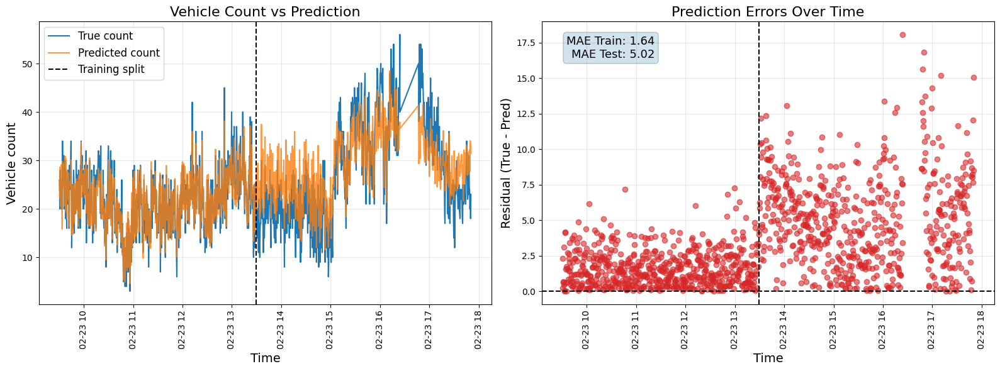

In [10]:
from sklearn.metrics import mean_absolute_error

# Split residuals
res_train = residuals[:split_idx]
res_test  = residuals[split_idx:]

# Compute MAE
mae_train = mean_absolute_error(y[:split_idx], y_pred[:split_idx])
mae_test  = mean_absolute_error(y[split_idx:], y_pred[split_idx:])

# --- Plotting ---
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Left: true vs predicted vehicle count across timeline
axes[0].plot(time_sorted, y, label="True count", color="C0")
axes[0].plot(time_sorted, y_pred, label="Predicted count", color="C1", alpha=0.8)
axes[0].axvline(time_sorted[split_idx], color='k', linestyle='--', label="Training split")
axes[0].set_xlabel("Time", fontsize=14)
axes[0].set_ylabel("Vehicle count", fontsize=14)
axes[0].set_title("Vehicle Count vs Prediction", fontsize=16)
axes[0].legend(fontsize=12)
axes[0].grid(alpha=0.3)
axes[0].tick_params(axis='x', rotation=90)

# Right: prediction errors across timeline
axes[1].plot(time_sorted, residuals, "o", color="C3", alpha=0.6)
axes[1].axhline(0, color='k', linestyle='--')
axes[1].axvline(time_sorted[split_idx], color='k', linestyle='--', label="Training split")
axes[1].set_xlabel("Time", fontsize=14)
axes[1].set_ylabel("Residual (True - Pred)", fontsize=14)
axes[1].set_title("Prediction Errors Over Time", fontsize=16)
axes[1].grid(alpha=0.3)
axes[1].tick_params(axis='x', rotation=90)

# Display MAE on the plot
textstr = f"MAE Train: {mae_train:.2f}\nMAE Test: {mae_test:.2f}"
axes[1].text(0.25, 0.95, textstr, transform=axes[1].transAxes,
             fontsize=13, va='top', ha='right',
             bbox=dict(boxstyle="round", alpha=0.2))

plt.tight_layout()
plt.show()

We observe that the residuals are slightly larger on the test set, but overall the errors remain relatively uniform across the timeline. Notably, the error does not increase for the last images, which are affected by the domain shift (raindrops on the camera).  

This illustrates that the presence of a domain shift does **not necessarily lead to worse performance**, particularly when using regularized models such as Ridge regression.  

It is also important to note that the ground truth vehicle counts are **underestimates of the actual number of vehicles**, as human annotators were unable to accurately count all vehicles in blurry frames.

--------

This can also be explained by the fact that the features most relevant for the prediction are **not the ones where the domain shift is most pronounced**.  

Indeed, if we select the top 3 features used by the Ridge model, we can observe that these features show **little to no shift** over time, which helps the model remain robust despite changes in the input distribution.

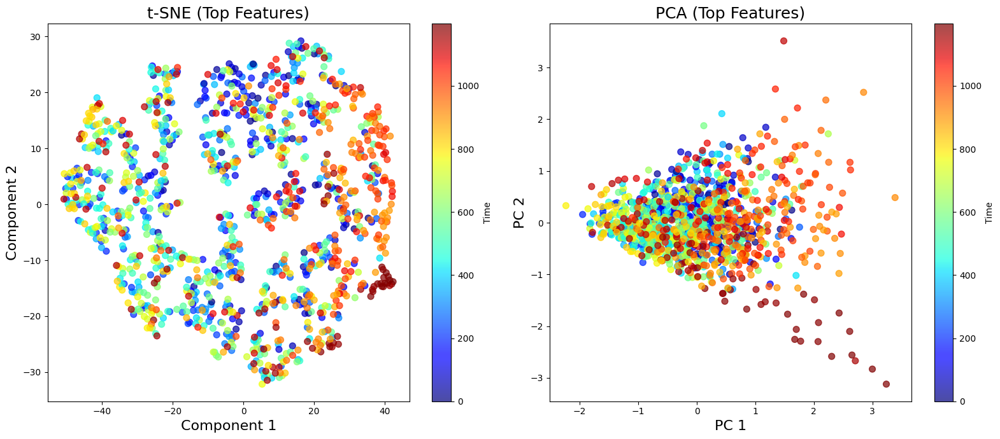

In [12]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import numpy as np

# Number of top features to select
K = 3
coefs = ridge.coef_

# Get indices of top K features by absolute value
top_idx = np.argsort(np.abs(coefs))[-K:][::-1]

# Subset the CityCam features
X_top = citycam_data['Xt'][:, top_idx]

# Time array for coloring
time_arr = np.zeros(len(args))
time_arr[args] = np.arange(len(args))

# --- t-SNE on top features ---
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_coords = tsne.fit_transform(X_top)

# --- PCA on top features ---
pca = PCA(n_components=2, random_state=42)
pca_coords = pca.fit_transform(X_top)

# --- Plot side by side ---
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# t-SNE plot
scatter_tsne = axes[0].scatter(tsne_coords[:, 0], tsne_coords[:, 1],
                               c=time_arr, cmap='jet', s=50, alpha=0.7)
axes[0].set_title('t-SNE (Top Features)', fontsize=18)
axes[0].set_xlabel('Component 1', fontsize=16)
axes[0].set_ylabel('Component 2', fontsize=16)
plt.colorbar(scatter_tsne, ax=axes[0], label='Time')

# PCA plot
scatter_pca = axes[1].scatter(pca_coords[:, 0], pca_coords[:, 1],
                              c=time_arr, cmap='jet', s=50, alpha=0.7)
axes[1].set_title('PCA (Top Features)', fontsize=18)
axes[1].set_xlabel('PC 1', fontsize=16)
axes[1].set_ylabel('PC 2', fontsize=16)
plt.colorbar(scatter_pca, ax=axes[1], label='Time')

plt.tight_layout()
plt.show()

## Star History Dataset

The next dataset contains **star formation histories** from three cosmological simulations of the universe. Each simulation provides the evolution of stars over ~14 billion years (roughly the age of the universe), including:  

- **Stellar mass evolution:** how the mass of each star changes over time.  
- **Flux observed on Earth:** the radiation from the star as it would be detected by a telescope.  

The goal is to **predict the stellar mass or properties from the observed flux**.  

In practice, the target dataset would correspond to the flux measured from **real stars on Earth**, for which the true mass evolution is unknown.  

To simulate a **domain shift** that can be quantitatively evaluated, we treat one simulation as the **target domain** and the remaining simulations as the **source domain**. This allows us to study how models trained on one simulation generalize to another.

In [13]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error

In [14]:
datasets_path = "./data/sfh/"

flux_filename_simbaz0 = datasets_path+'simba_z=0.0_flux.csv'
flux_filename_eaglez0 = datasets_path+'eagle_z=0.0_flux.csv'
flux_filename_tngz0 = datasets_path+'tng_z=0.0_flux.csv'

sfh_filename_simbaz0 = datasets_path+'simba_z=0.0_sfh.csv'
sfh_filename_eaglez0 = datasets_path+'eagle_z=0.0_sfh.csv'
sfh_filename_tngz0 = datasets_path+'tng_z=0.0_sfh.csv'

flux_simbaz0 = pd.read_csv(flux_filename_simbaz0, index_col=0)
flux_eaglez0 = pd.read_csv(flux_filename_eaglez0, index_col=0)
flux_tngz0 = pd.read_csv(flux_filename_tngz0, index_col=0)
sfh_simbaz0 = pd.read_csv(sfh_filename_simbaz0, index_col=0)
sfh_eaglez0 = pd.read_csv(sfh_filename_eaglez0, index_col=0)
sfh_tngz0 = pd.read_csv(sfh_filename_tngz0, index_col=0)

dict_X = {"simba": flux_simbaz0, "eagle": flux_eaglez0, "tng": flux_tngz0}
dict_y_sfh = {"simba": sfh_simbaz0, "eagle": sfh_eaglez0, "tng": sfh_tngz0}

In [15]:
X_base = np.empty((0, dict_X["simba"].shape[1]))
y_mass = np.empty((0,))
y_true = np.empty((0, dict_y_sfh["simba"].shape[1]))
indexes = {}
sub_indexes = {}
length = 0

for k in ["simba", "tng", "eagle"]:
    X_base = np.concatenate((X_base, dict_X[k]))
    y_true = np.concatenate((y_true, dict_y_sfh[k]))
    indexes[k] = np.arange(len(dict_X[k])) + length
    length += len(dict_X[k])
    print("Domain %s - n_samples : %i"%(k, len(dict_X[k])))
    
print("X shape: %s, y shape: %s"%(str(X_base.shape), str(y_true.shape)))

Domain simba - n_samples : 1688
Domain tng - n_samples : 9633
Domain eagle - n_samples : 4697
X shape: (16018, 21), y shape: (16018, 29)


In [16]:
TARGET = "eagle"
SOURCES = ["simba", "eagle", "tng"]
SOURCES.remove(TARGET)

print("TARGET = %s\nSOURCES = %s + %s"%(TARGET, SOURCES[0], SOURCES[1]))

TARGET = eagle
SOURCES = simba + tng


In [17]:
# Set index for source and target sample
src_index = np.concatenate([indexes[k] for k in SOURCES])
tgt_index = np.concatenate([indexes[k] for k in [TARGET]])

# Rescale X features (first log transformation, then scaling based of source scales)
X = np.log10(X_base+1)
std_sc = StandardScaler()
std_sc.fit(X[src_index])
X = std_sc.transform(X)

# Scaling y
y = np.copy(y_true)

We first show the PCA of the input feature space (flux)

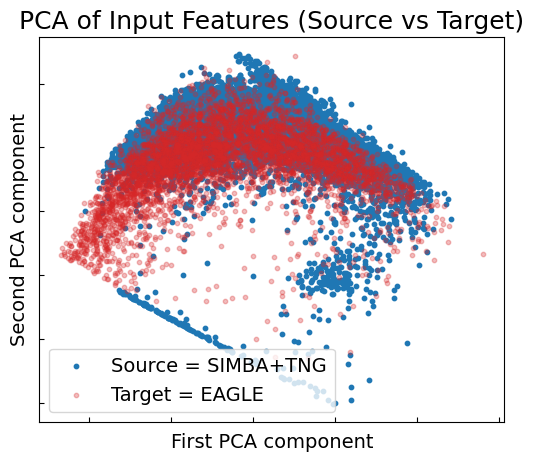

In [18]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

fig, ax = plt.subplots(figsize=(6, 5))

# Compute PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Scatter plot
ax.scatter(X_pca[src_index, 0], X_pca[src_index, 1], s=10, label="Source = SIMBA+TNG")
ax.scatter(X_pca[tgt_index, 0], X_pca[tgt_index, 1], s=10, alpha=0.3, c="C3", label="Target = EAGLE")

# Labels and title
ax.set_xlabel("First PCA component", fontsize=14)
ax.set_ylabel("Second PCA component", fontsize=14)
ax.set_title("PCA of Input Features (Source vs Target)", fontsize=18)

# Legend
lgd = ax.legend(fontsize=14)

# Optional: remove tick labels for cleaner look
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.tick_params(direction='in')

plt.show()

We observe that, although the distributions are shifted, the **support of the source domain largely overlaps** with that of the target domain. This represents a **more controlled and manageable domain shift** compared to cases where the supports are very different.

----------

We know fit a linear model between the flux and the star mass evolution. We fit the model on source only.

In [19]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import numpy as np

# --- Split source into train/test ---
X_train, X_test, y_train, y_test = train_test_split(
    X[src_index], y[src_index], test_size=0.2, random_state=42
)

# --- Fit model on source train ---
rf = RandomForestRegressor(
    n_estimators=50,
    max_depth=10,
    max_features='sqrt',
    random_state=42,
    n_jobs=-1
)
rf.fit(X_train, y_train)

# --- Predictions ---
y_pred_test = rf.predict(X_test)
y_pred_tgt  = rf.predict(X[tgt_index])

# --- Sum over instances (axis=0) to get total curves ---
y_test_sum = y_test.sum(axis=0)
y_pred_test_sum = y_pred_test.sum(axis=0)

y_tgt_sum = y[tgt_index].sum(axis=0)
y_pred_tgt_sum = y_pred_tgt.sum(axis=0)

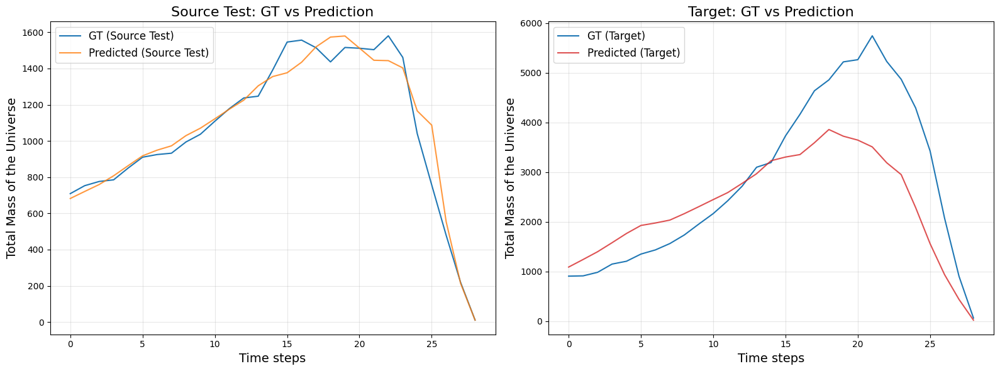

In [20]:
# --- Plotting ---
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Left: Source test
axes[0].plot(y_test_sum, label="GT (Source Test)", color="C0")
axes[0].plot(y_pred_test_sum, label="Predicted (Source Test)", color="C1", alpha=0.8)
axes[0].set_xlabel("Time steps", fontsize=14)
axes[0].set_ylabel("Total Mass of the Universe", fontsize=14)
axes[0].set_title("Source Test: GT vs Prediction", fontsize=16)
axes[0].legend(fontsize=12)
axes[0].grid(alpha=0.3)

# Right: Target
axes[1].plot(y_tgt_sum, label="GT (Target)", color="C0")
axes[1].plot(y_pred_tgt_sum, label="Predicted (Target)", color="C3", alpha=0.8)
axes[1].set_xlabel("Time steps", fontsize=14)
axes[1].set_ylabel("Total Mass of the Universe", fontsize=14)
axes[1].set_title("Target: GT vs Prediction", fontsize=16)
axes[1].legend(fontsize=12)
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

In this plot, we compare the **ground truth** and **predicted evolution** of the total stellar mass in the universe.

- The curves are obtained by **summing the mass of all stars** at each time step, providing an estimate of the **total mass of the universe** across time.  
- The **left panel** shows predictions on the source test set, while the **right panel** shows predictions on the target simulation, which was not used for training.  
- **Time step 0 corresponds to the present day**, and increasing time steps move backward in cosmic time.  

This visualization allows us to assess how well the model captures the overall mass evolution. As we can see the evolution for the target domain is not well predicted even though the general trend is respected.

## CT-Scan Dataset

We now consider a real-life transfer scenario using the [CT-Scan dataset](https://archive.ics.uci.edu/ml/datasets/Relative+location+of+CT+slices+on+axial+axis) from the UCI machine leanring repository.

This dataset is composed of more than $50000$ Ct-Scan slices coming from around $100$ different patients. The goal is to predict the relative location of the slice in the patient based on features extracted from the slice.

We consider the following transfer learning scenario, where the learner has access to labeled data for every patients except one:  discard the patient with the more data and consider it as a target patient. We are in the realistic situation where an expert (radiologist) has labeled the data for many patients, but the model is applied on new coming patient for which no labels is available.

In [21]:
df = pd.read_csv("./data/slice_localization_data.zip")

print(df.shape)
df.head()

(53500, 386)


,patientId,value0,value1,value2,value3,value4,value5,value6,value7,value8,...,value375,value376,value377,value378,value379,value380,value381,value382,value383,reference
0,0,0.0,0.0,0.0,0.0,0.0,0.0,-0.25,-0.25,-0.25,...,-0.25,0.980381,0.0,0.0,0.0,0.0,0.0,-0.25,-0.25,21.803851
1,0,0.0,0.0,0.0,0.0,0.0,0.0,-0.25,-0.25,-0.25,...,-0.25,0.977008,0.0,0.0,0.0,0.0,0.0,-0.25,-0.25,21.745726
2,0,0.0,0.0,0.0,0.0,0.0,0.0,-0.25,-0.25,-0.25,...,-0.25,0.977008,0.0,0.0,0.0,0.0,0.0,-0.25,-0.25,21.687600
3,0,0.0,0.0,0.0,0.0,0.0,0.0,-0.25,-0.25,-0.25,...,-0.25,0.977008,0.0,0.0,0.0,0.0,0.0,-0.25,-0.25,21.629474
4,0,0.0,0.0,0.0,0.0,0.0,0.0,-0.25,-0.25,-0.25,...,-0.25,0.976833,0.0,0.0,0.0,0.0,0.0,-0.25,-0.25,21.571348


In [22]:
X = df.drop(["patientId", "reference"], axis=1)
y = df["reference"]

source_ids = [i for i in range(97) if i != 46]
target_ids = [46]

X_src = X.loc[df.patientId.isin(source_ids)]
X_tgt = X.loc[df.patientId.isin(target_ids)]

y_src = y.loc[df.patientId.isin(source_ids)]
y_tgt = y.loc[df.patientId.isin(target_ids)]

print("Shape of Xs", X_src.shape)
print("Shape of Xt", X_tgt.shape)

Shape of Xs (51751, 384)
Shape of Xt (1749, 384)


> Autonomy exercise: plot the first components of the PCA and determine the characteristics of the domain shift